In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,roc_auc_score,roc_curve
from pandas_profiling import ProfileReport


In [2]:
df = pd.read_csv(r'C:\Users\r.vardhan.reddy\Desktop\Algorithms\winequality-red.csv')
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [3]:
df.quality.unique()

array([5, 6, 7, 4, 8, 3], dtype=int64)

In [4]:
set(df.quality)

{3, 4, 5, 6, 7, 8}

In [5]:
#df['text'] = 'Harsha'

In [6]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [7]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/25 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
x=df.drop(columns=['quality'])
x.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4


In [9]:
y=df.quality
y.head()

0    5
1    5
2    5
3    6
4    5
Name: quality, dtype: int64

In [10]:
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [11]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.20,random_state=0)

In [12]:
x_train


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
642,9.9,0.540,0.45,2.3,0.071,16.0,40.0,0.99910,3.39,0.62,9.4
679,10.8,0.260,0.45,3.3,0.060,20.0,49.0,0.99720,3.13,0.54,9.6
473,9.9,0.350,0.55,2.1,0.062,5.0,14.0,0.99710,3.26,0.79,10.6
390,5.6,0.850,0.05,1.4,0.045,12.0,88.0,0.99240,3.56,0.82,12.9
1096,6.6,0.725,0.09,5.5,0.117,9.0,17.0,0.99655,3.35,0.49,10.8
...,...,...,...,...,...,...,...,...,...,...,...
763,9.3,0.655,0.26,2.0,0.096,5.0,35.0,0.99738,3.25,0.42,9.6
835,7.6,0.665,0.10,1.5,0.066,27.0,55.0,0.99655,3.39,0.51,9.3
1216,7.9,0.570,0.31,2.0,0.079,10.0,79.0,0.99677,3.29,0.69,9.5
559,13.0,0.470,0.49,4.3,0.085,6.0,47.0,1.00210,3.30,0.68,12.7


In [13]:
df.count()

fixed acidity           1599
volatile acidity        1599
citric acid             1599
residual sugar          1599
chlorides               1599
free sulfur dioxide     1599
total sulfur dioxide    1599
density                 1599
pH                      1599
sulphates               1599
alcohol                 1599
quality                 1599
dtype: int64

In [14]:
dt_model = DecisionTreeClassifier()

In [15]:
dt_model.fit(x_train,y_train)

DecisionTreeClassifier()

In [16]:
import matplotlib.pyplot as plt

[Text(485.9399709564121, 1061.3142857142857, 'X[10] <= 10.35\ngini = 0.648\nsamples = 1279\nvalue = [8, 42, 546, 496, 172, 15]'),
 Text(243.92399135446686, 1009.5428571428572, 'X[9] <= 0.585\ngini = 0.527\nsamples = 703\nvalue = [5, 23, 428, 222, 24, 1]'),
 Text(48.31745317002882, 957.7714285714286, 'X[10] <= 9.075\ngini = 0.42\nsamples = 331\nvalue = [3, 15, 242, 69, 2, 0]'),
 Text(9.648414985590778, 906.0, 'X[6] <= 71.0\ngini = 0.587\nsamples = 15\nvalue = [0, 2, 5, 8, 0, 0]'),
 Text(6.432276657060519, 854.2285714285715, 'X[7] <= 0.996\ngini = 0.43\nsamples = 11\nvalue = [0, 2, 1, 8, 0, 0]'),
 Text(3.2161383285302594, 802.4571428571429, 'gini = 0.0\nsamples = 2\nvalue = [0, 2, 0, 0, 0, 0]'),
 Text(9.648414985590778, 802.4571428571429, 'X[2] <= 0.55\ngini = 0.198\nsamples = 9\nvalue = [0, 0, 1, 8, 0, 0]'),
 Text(6.432276657060519, 750.6857142857143, 'gini = 0.0\nsamples = 8\nvalue = [0, 0, 0, 8, 0, 0]'),
 Text(12.864553314121038, 750.6857142857143, 'gini = 0.0\nsamples = 1\nvalue = [0

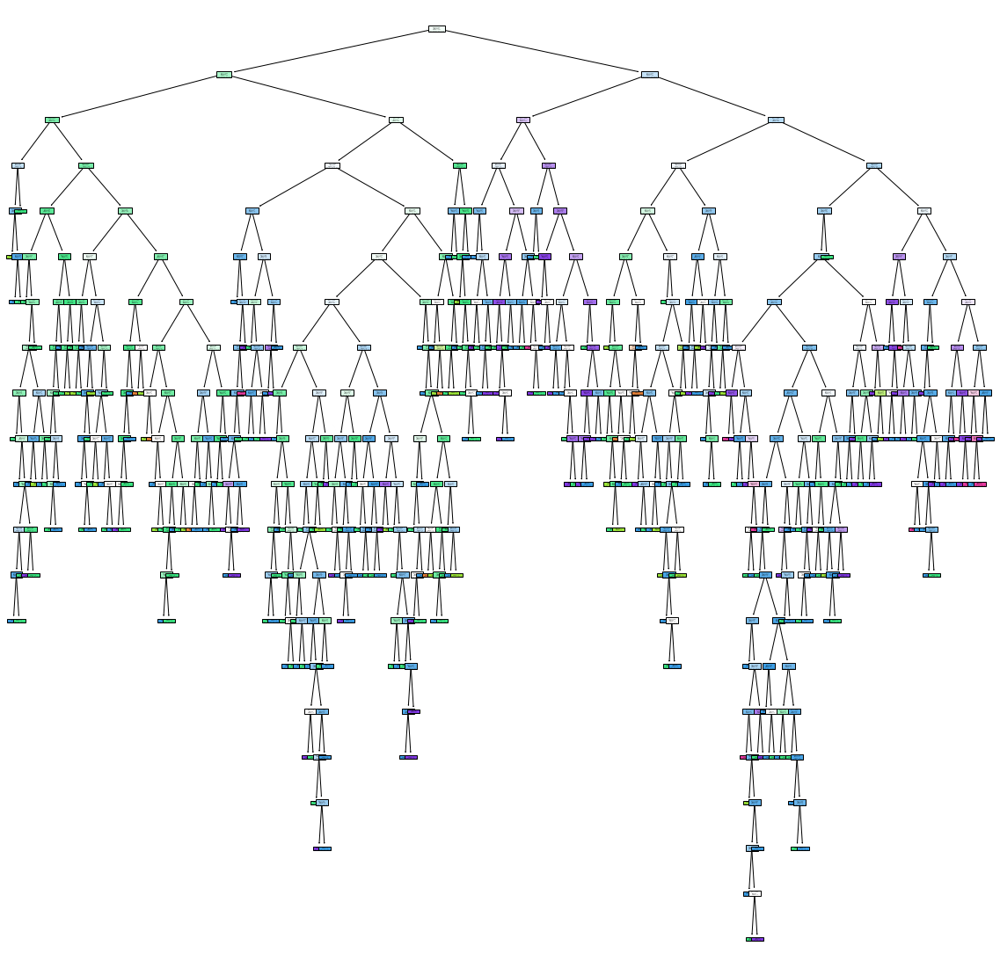

In [17]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model,filled=True)

In [18]:
df1=df.head(50)

In [19]:
x1=df1.drop(columns='quality')

In [20]:
y1=df1.quality

In [21]:
df_model1 = DecisionTreeClassifier()

In [22]:
df_model1.fit(x1,y1)

DecisionTreeClassifier()

[Text(462.09375, 1032.8400000000001, 'X[9] <= 0.515\ngini = 0.538\nsamples = 50\nvalue = [4, 32, 10, 4]'),
 Text(209.25, 924.1200000000001, 'X[2] <= 0.07\ngini = 0.56\nsamples = 5\nvalue = [3, 1, 0, 1]'),
 Text(139.5, 815.4000000000001, 'X[1] <= 0.625\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 0, 1]'),
 Text(69.75, 706.6800000000001, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]'),
 Text(209.25, 706.6800000000001, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]'),
 Text(279.0, 815.4000000000001, 'gini = 0.0\nsamples = 3\nvalue = [3, 0, 0, 0]'),
 Text(714.9375, 924.1200000000001, 'X[10] <= 10.55\ngini = 0.471\nsamples = 45\nvalue = [1, 31, 10, 3]'),
 Text(523.125, 815.4000000000001, 'X[1] <= 0.285\ngini = 0.414\nsamples = 42\nvalue = [0, 31, 8, 3]'),
 Text(348.75, 706.6800000000001, 'X[0] <= 8.7\ngini = 0.444\nsamples = 3\nvalue = [0, 0, 2, 1]'),
 Text(279.0, 597.96, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1]'),
 Text(418.5, 597.96, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 2, 0]'),
 T

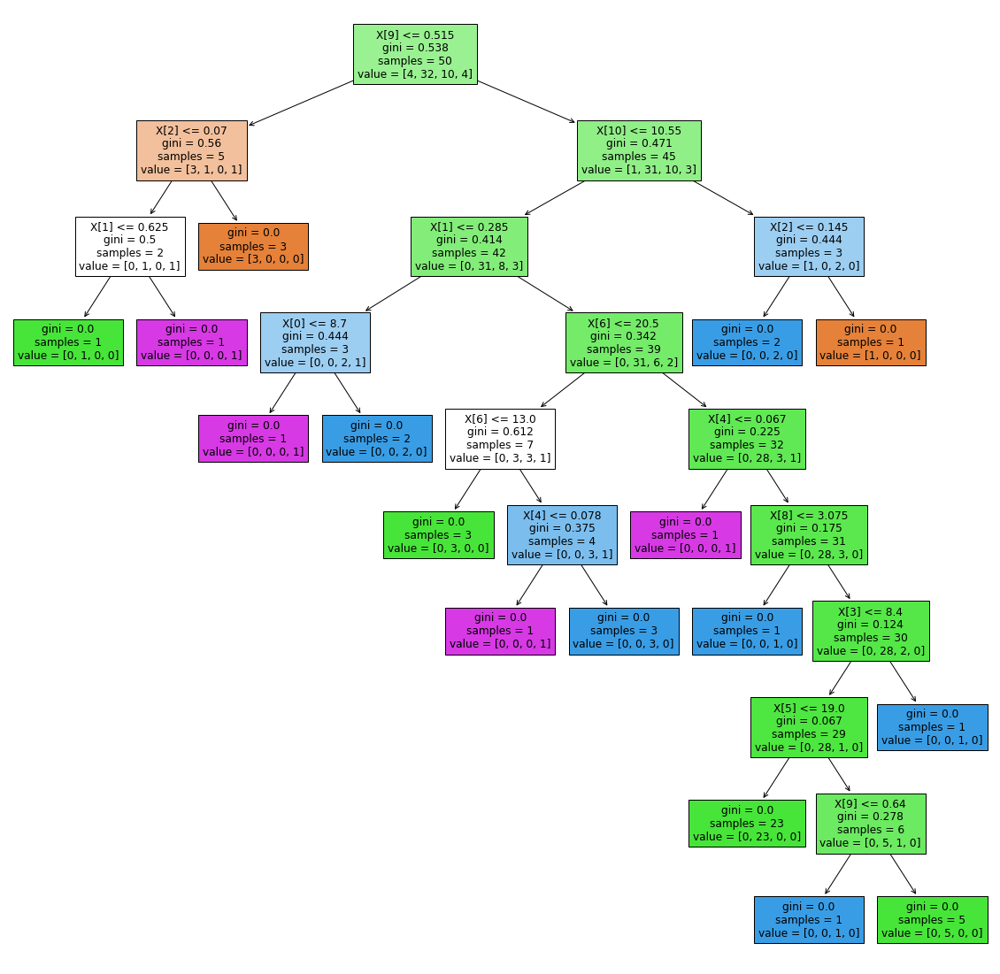

In [23]:
plt.figure(figsize=(20,20))
tree.plot_tree(df_model1,filled=True)

In [24]:
y_pred=df_model1.predict(x_test)

In [25]:
accuracy_score(y_test,y_pred)

0.315625

In [26]:
df_model1.predict([x_test.iloc[3]])

array([4], dtype=int64)

In [27]:
dt_model.score(x_train,y_train)

1.0

In [28]:
dt_model.score(x_test,y_test)

0.678125

In [29]:
y_pred=dt_model.predict(x_test)

In [30]:
accuracy_score(y_test,y_pred)

0.678125

## refer Decission tree practical 8 AM IST  file for pruning using cc_alpha 

# Stability of model is more important that accuracy
## Accuracy of train and test data should be almost same then only our model will be stable